In [34]:
!pip install transformers==4.48.0
# !pip install datasets[audio]
# # !pip install huggingface-hub
# # !pip install joblib
# !pip install librosa

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 33.2 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: transformers
    Found existing installation: transformers 4.52.4
    Uninstalling transformers-4.52.4:
      Successfully uninstalled transformers-4.52.4


In [6]:
# !pip install numpy==1.26.4

In [ ]:
# !pip install matplotlib

In [ ]:
# !pip install evaluate 
# !pip install jiwer
# !pip install transformers[torch]

# Audio

Обработка звуковых сигналов - это отдельное направление в computer science, со своими особенностями и методами. Когда дело касается обработки речи, то есть сильное пересечение c NLP/компьютерной и вообще лингвистикой, так как без понимания языка в целом тут не обойтись. Распознавание/генерация речи также очень полезные на практике задачи, поэтому давайте про них немного поговорим. 

Это не моя область, поэтому ноутбук будет достаточно вводным, но я постарался добавить ссылки на материалы, где можно почитать про все это подробнее.

### работа с audio данными в питоне

Мы уже привыкли к пайплайнам обработки текста (фильтрации, нормализации, токенизации и т.п.). Со звуком такая же история, но с моей точки зрения, немного посложнее

Для начала давайте загрузим какой-то аудиофайл и просто его воспроизведем. В jupyter для этого есть встроенный виджет

In [33]:
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio
import numpy as np


array, sampling_rate = librosa.load(librosa.ex("trumpet"))

In [ ]:
# На записи звук трубы. 
display(Audio(array, rate=sampling_rate), "Trumpet")

Звук это физическая волна, которую могут улавливать наши уши. 
Для того, чтобы передать звук на компьютер его тоже нужно чем-то зарегистрировать и записать в цифровом формате. 
Звуковая волна передается через среду (например воздух) и это выражается в зонах с повышенным или пониженным давлением.   

![](https://benwolffblog.wordpress.com/wp-content/uploads/2018/04/loudspeaker-waveform.gif?w=472&h=222)

Эти изменения (и их силу) можно регистрировать с помощью специальных устройств (диафрагмы в микрофонах отвечают за это). Оцифрованный звук - это последовательность значений, которые зарегистрировало устройство при записи. 
Регистровать эти значения невозможно постоянно, иначе их получится бесконечное количество. Поэтому регистратор делает записи с каким-то определенным интервалом. Его называют sampling rate (возможно вы заметили эту переменную выше). Он показывает сколько записей делается за секунду. По этому интервалу можно понять сколько секунд длится запись (поделив все количество значение на sampling rate). Для этого даже есть специальная единица измерения - герц (hertz). 

Значения, которые записывает микрофон, показывают амплитуду колебания. Наши уши воспринимают увеличение амплитуды как увеличение громкости. Для амплитуды используют не какие-то произвольные числа, а стандартную единицу измерения - децибел. Во-первых, она привязана к нашей физической способности слышать - мы можем воспринимать звуковые волны только в определенном диапазоне (ниже которого мы не слышим, а выше которого у нас лопаются перепонки). Поэтому 0 дБ - это самый тихий звук, а болевые ощущения начинаются после 120 дБ. Во-вторых, в нем используется логарифмическая шкала, так как интервал слышимости все еще очень большой и неудобно записывать это все линейно. К тому же разница между тихими звуками сильнее (для нас), чем между громкими.

In [ ]:
# В примере с трубой значение в интервале от -1 до 1, так как они нормализованы для удобства
# но за основу все еще взяты децибелы
array

array([-1.4068211e-03, -4.4607485e-04, -4.1098098e-04, ...,
        7.9623042e-06, -3.0417003e-05,  1.2765069e-05], dtype=float32)

Такой формат записи данных назвается waveform (возможно вы встречали .wav формат). И его можно визуализировать на waveplot

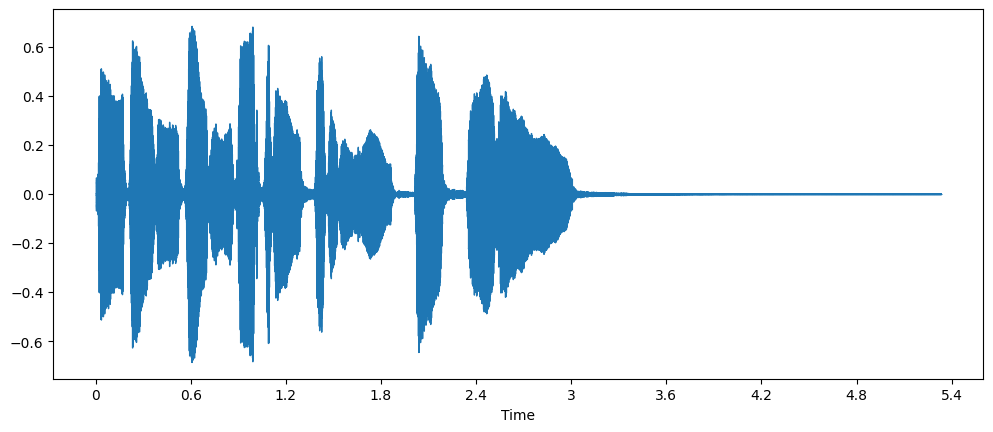

In [ ]:
# звук трубы выглядит как-то так
plt.figure().set_figwidth(12)
librosa.display.waveshow(array, sr=sampling_rate)

Волна определяется не только амплитудой, но и частотой колебаний. sampling rate это не просто какой-то физическое ограничение на количество записей значений, но и параметр, который влияет на то какой звук записывается. Для того, чтобы правильно уловить звуковую волну, sampling rate должен быть достаточно высоким, иначе она запишется некорректно (это называется aliasing) и превратится в какую-то другую волну. 

![](https://docs-be.ni.com/bundle/labwindows-cvi/page/advancedanalysisconcepts/guid-932173fe-d89c-4bc0-a3ed-980f99bcc06b-help-web.png?_LANG=enus)

Частоты для нас воспринимаются как понижение/повышение тона. Также есть интервалы частот, которые мы можем распознать (ниже будет инфразвук а выше ультразвук), поэтому sampling rate все таки нет смысла увеличивать выше каких-то пределов (44kHZ sampling rate поймает все то что мы можем услышать, но там еще есть отдельные особенности с направлением звука и для профессиональных ситуаций могут использовать и очень высокие значение вроде 192kHZ, естественно это сильно увеличивает потребление памяти). Восприятие частоты это еще более сложная вещь, чем восприятие амплитуды. Две частоты отличающиеся друг от друга в два раза для нас слышаться как одинаковые, но выше/ниже. На этом (как я понимаю) многое построено в музыке - октавы определяются как интервал где соотношение частот между крайними элементами составляет 1:2. Но это нам не так важно.

Звук, как правило состоит не из одной волны, а из множества наложенных друг на друга волн с разной частотой и амплитудой. Другим способом представить звук может быть разложение его на частоты (спектр). Для этого используется дискретное преобразование Фурье (DFT). Как оно работает нам не важно, главное что в итоге получается звук разложенный по частотам.

Давайте визуализируем тот же самый звук

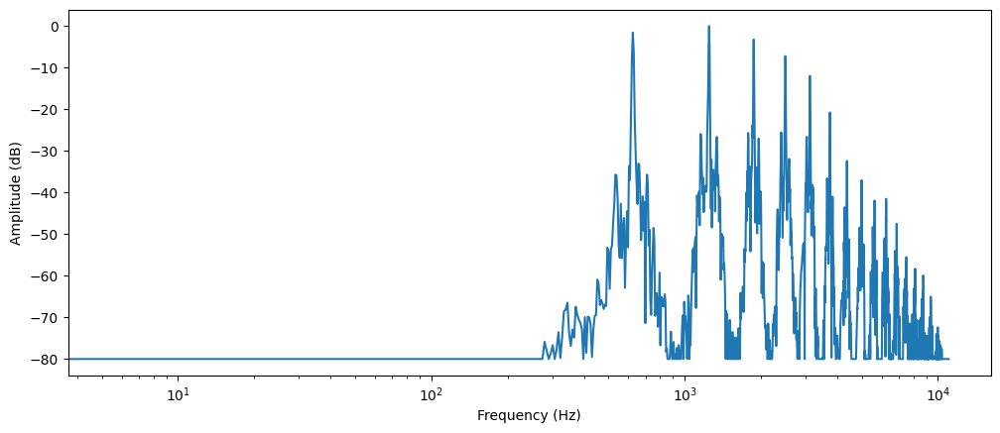

In [ ]:
dft_input = array[:4096]

# calculate the DFT
window = np.hanning(len(dft_input))
windowed_input = dft_input * window
dft = np.fft.rfft(windowed_input)

# get the amplitude spectrum in decibels
amplitude = np.abs(dft)
amplitude_db = librosa.amplitude_to_db(amplitude, ref=np.max)

# get the frequency bins
frequency = librosa.fft_frequencies(sr=sampling_rate, n_fft=len(dft_input))

plt.figure().set_figwidth(12)
plt.plot(frequency, amplitude_db)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude (dB)")
plt.xscale("log")

Такое представление описывает весь звук целиком без временной шкалы. Часто также используют представление звукозаписи в виде последовательных спектров, применяемых к временному интервалу. Это называется спектограмма. Такая визуализация позволяет увидеть амплитуды (закодированы цветов) и частоты (y axis) в коротких временных промежутках и детально проанализировать отдельные музыкальные иструменты или даже отдельные речевые звуки (гласные). 

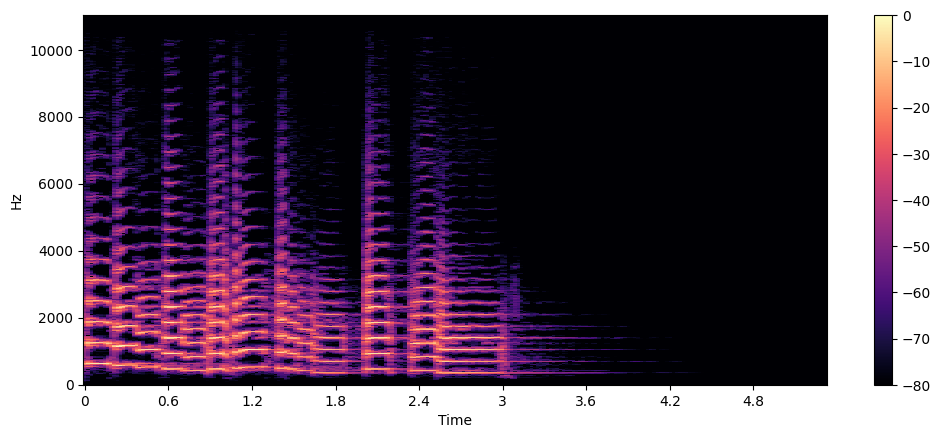

In [9]:
D = librosa.stft(array)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure().set_figwidth(12)
librosa.display.specshow(S_db, x_axis="time", y_axis="hz")
plt.colorbar()

Другой вариант спектограммы - mel spectogram. В ней частотный диапазон слегка преобразован, чтобы точнее соответствовать восприятию частоты человеком (она логарифмическая чтобы передать что разница между низкими частотами воспринимается сильнее и к частотам применяются специальные фильтры)

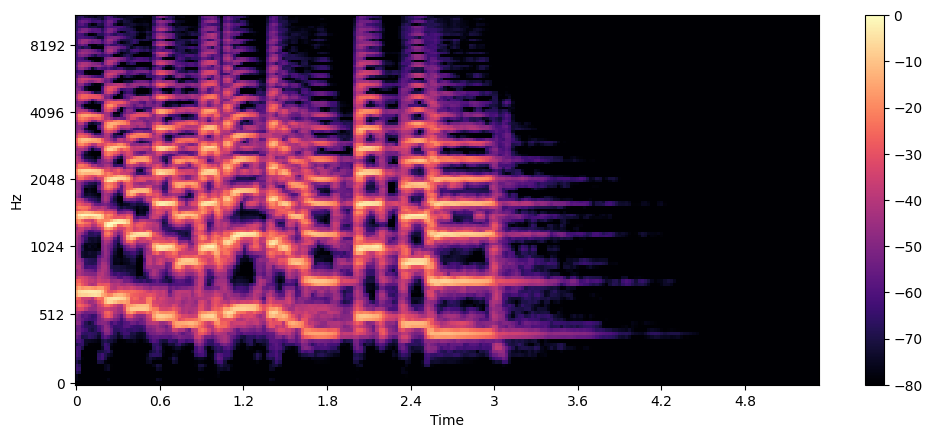

In [30]:
S = librosa.feature.melspectrogram(y=array, sr=sampling_rate, n_mels=128, fmax=8000)
S_dB = librosa.power_to_db(S, ref=np.max)

plt.figure().set_figwidth(12)
librosa.display.specshow(S_dB, x_axis="time", y_axis="mel", sr=sampling_rate)
plt.colorbar()

Mel spectogram очень широко применяется в машинном обучении при работе со звукам. Часто на вход моделям передается как раз такое представление звукозаписи. Например, mel spectogram изпользуется в whisper, одной из самых известных моделей для распознавания речи 

Больше про обработку звука можно узнать вот из этого курса - https://www.youtube.com/playlist?list=PL-wATfeyAMNqIee7cH3q1bh4QJFAaeNv0

Или еще в мини курсе от huggingface есть хорошее введение - https://huggingface.co/learn/audio-course/en/chapter0/introduction

## Whisper

Whisper - это модель от OpenAI, которая умеет распознавать текст из речи на разных языках. Это трансформерная модель, которая обучена на парах текст-речь. Whisper был сделан до chatgpt, в то время когда OpenAI все еще публиковали открытые модели.

Статья про whisper - https://cdn.openai.com/papers/whisper.pdf


Сначала давайте возьмем feature extractor от whisper, который предобработает наш звук в формат, на котором была обучена модель

In [ ]:
from transformers import WhisperFeatureExtractor

feature_extractor = WhisperFeatureExtractor.from_pretrained("openai/whisper-small", )

Для обучения они использовали куски аудио в 30 секунд с sampling rate равным 16000 (это можем быть мало для музыки, но для человеческой речи этого достаточно). Изначальная запись у нас в 22050 поэтому нужно будет сделать resampling (то есть отбросить какие-то промежуточные значения и ухудшить качество)

In [5]:
sampling_rate

22050

In [7]:
resampled_array = librosa.resample(array, orig_sr=sampling_rate, target_sr=16000)

In [ ]:
# попробуйте услышать разницу
display(Audio(resampled_array, rate=16000), "Trumpet")

In [13]:
output = feature_extractor(resampled_array, sampling_rate=16000)

In [ ]:
# mel spectogram это по сути последовательность эмбедингов которые уже можно кормить в модель
output['input_features']

array([[[-0.46050477, -0.6917589 , -0.62964404, ..., -0.7904407 ,
         -0.7904407 , -0.7904407 ],
        [-0.24369931, -0.44348943, -0.5385618 , ..., -0.7904407 ,
         -0.7904407 , -0.7904407 ],
        [-0.17753041, -0.3146279 , -0.57816255, ..., -0.7904407 ,
         -0.7904407 , -0.7904407 ],
        ...,
        [-0.29086447, -0.3094461 , -0.37044418, ..., -0.7904407 ,
         -0.7904407 , -0.7904407 ],
        [-0.3476007 , -0.4430517 , -0.33450615, ..., -0.7904407 ,
         -0.7904407 , -0.7904407 ],
        [-0.45817244, -0.70379496, -0.594295  , ..., -0.7904407 ,
         -0.7904407 , -0.7904407 ]]], dtype=float32)

In [16]:
# в случае с whisper получается 80 векторов размерности 3000
output['input_features'].shape

(1, 80, 3000)

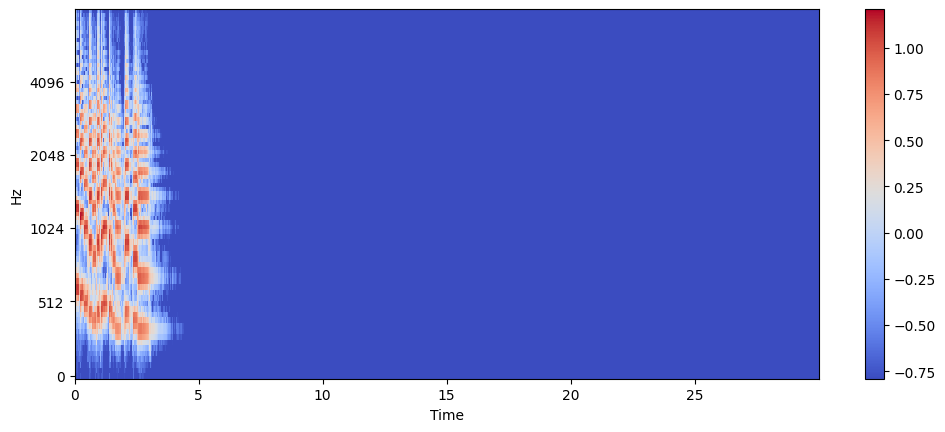

In [18]:
# если визуализировать то получится очень похоже на спектограмму выше,
# только тут есть пустота из-за того, что все увеличивается или уменьшается до 30 секунд
# и амплитуды опять же в float формате
plt.figure().set_figwidth(12)
librosa.display.specshow(output['input_features'][0], x_axis="time", y_axis="mel", sr=16000, hop_length=feature_extractor.hop_length,)
plt.colorbar()

Когда преобразование Фурье применяется к звуковой записи, то на выходе сохраняется вся информация и из нее можно восстановить изначальную запись обратно. Но в машинном обучении часть информации (которая хранится в комплексных числах) обычно отбрасывается и восстановить саму запись напрямую нельзя. Тем более это нельзя сделать когда модель генерирует mel spectogram как результат. Для того чтобы воспроизвести полученную запись используют отдельные специальные модели, которые называются вокодеры.

Если взять предобученный вокодер и пропустить через него mel spectogram то полчится что-то похожее на изначальную запись

In [ ]:
from transformers import SpeechT5HifiGan
import torch

vocoder = SpeechT5HifiGan.from_pretrained("microsoft/speecht5_hifigan", normalize_before=False, 
                                          
                                          )

In [ ]:
o = vocoder(torch.Tensor(output['input_features'][0]).T)

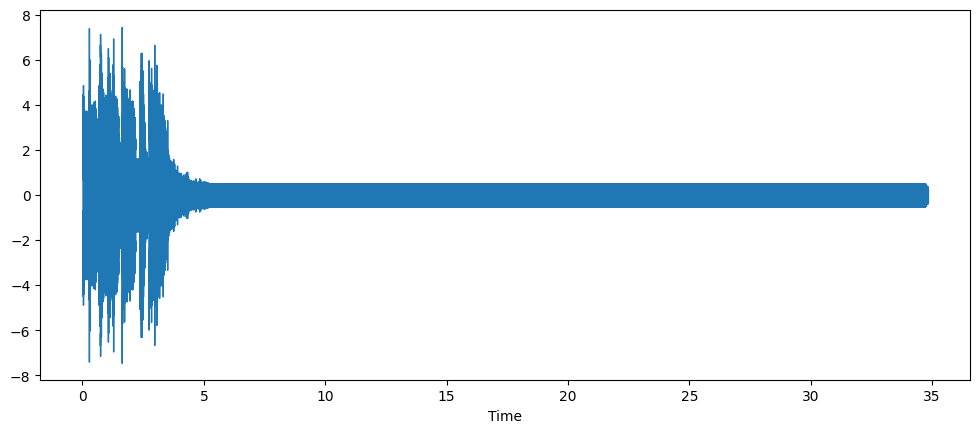

In [ ]:
plt.figure().set_figwidth(12)
librosa.display.waveshow(o.detach().numpy())

In [ ]:
display(Audio(o.detach().numpy(), rate=25000), "Trumpet")

# Обучение моделей

Теперь давайте попробуем пообучать какие-то базовые модели. Для начала попробуем классическую модель wav2vec. Как можно догадаться это модель что-то вроде word2vec в мире звука. Статья про wav2vec - https://arxiv.org/abs/2006.11477

### Importing the necessary libraries

In [1]:
import random
import logging
import os
# есть есть ошибки с cuda side error triggered то помогает выключить gpu и запустить на cpu чтобы понять где ошибка
# os.environ["CUDA_VISIBLE_DEVICES"] = ""

# import keras
import numpy as np
import torch
from IPython.display import Audio
from torch.utils.data import DataLoader
from torch import nn

### Define certain variables

In [55]:
# Maximum duration of the input audio file we feed to our Wav2Vec 2.0 model.
MAX_DURATION = 1
# Sampling rate is the number of samples of audio recorded every second
SAMPLING_RATE = 16000
BATCH_SIZE = 32  # Batch-size for training and evaluating our model.
NUM_CLASSES = 10  # Number of classes our dataset will have (11 in our case).
HIDDEN_DIM = 768  # Dimension of our model output (768 in case of Wav2Vec 2.0 - Base).
MAX_SEQ_LENGTH = MAX_DURATION * SAMPLING_RATE  # Maximum length of the input audio file.
# Wav2Vec 2.0 results in an output frequency with a stride of about 20ms.
MAX_FRAMES = 49
MAX_EPOCHS = 2  # Maximum number of training epochs.

MODEL_CHECKPOINT = "facebook/wav2vec2-base"  # Name of pretrained model from Hugging Face Model Hub

## Load the Google Speech Commands Dataset


Для того, чтобы попробовать обучать свои модели классификации звука мы возьмем вот этот датасет - [Google Speech Commands V1 Dataset](https://arxiv.org/abs/1804.03209),



In [3]:
# !pip install datasets soundfile

In [ ]:
from datasets import load_dataset

# speech_commands_v1 = load_dataset("superb", "ks")
speech_commands_v1 = load_dataset("google/speech_commands", "v0.02", )

The dataset has the following fields:

- **file**: the path to the raw .wav file of the audio
- **audio**: the audio file sampled at 16kHz
- **label**: label ID of the audio utterance

In [5]:
print(speech_commands_v1)

DatasetDict({
    train: Dataset({
        features: ['file', 'audio', 'label', 'is_unknown', 'speaker_id', 'utterance_id'],
        num_rows: 84848
    })
    validation: Dataset({
        features: ['file', 'audio', 'label', 'is_unknown', 'speaker_id', 'utterance_id'],
        num_rows: 9982
    })
    test: Dataset({
        features: ['file', 'audio', 'label', 'is_unknown', 'speaker_id', 'utterance_id'],
        num_rows: 4890
    })
})


В датасете 34 основных классов "Yes", "No", "Up", "Down", "Left", "Right", "On", "Off", "Stop", and "Go"  и еще один класс с тишиной. Для семинара возьмем поменьше данных (первые 10 классов)

In [6]:
speech_commands_v1["train"].features["label"].names

['yes',
 'no',
 'up',
 'down',
 'left',
 'right',
 'on',
 'off',
 'stop',
 'go',
 'zero',
 'one',
 'two',
 'three',
 'four',
 'five',
 'six',
 'seven',
 'eight',
 'nine',
 'bed',
 'bird',
 'cat',
 'dog',
 'happy',
 'house',
 'marvin',
 'sheila',
 'tree',
 'wow',
 'backward',
 'forward',
 'follow',
 'learn',
 'visual',
 '_silence_']

In [7]:
labels = speech_commands_v1["train"].features["label"].names[:10] # _unknown_ и _silence_ это два последних класса
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = str(i)
    id2label[str(i)] = label

print(id2label)

{'0': 'yes', '1': 'no', '2': 'up', '3': 'down', '4': 'left', '5': 'right', '6': 'on', '7': 'off', '8': 'stop', '9': 'go'}


In [8]:
speech_commands_v1 = speech_commands_v1.filter(lambda x: str(x["label"]) in id2label)

In [9]:
speech_commands_v1

DatasetDict({
    train: Dataset({
        features: ['file', 'audio', 'label', 'is_unknown', 'speaker_id', 'utterance_id'],
        num_rows: 30769
    })
    validation: Dataset({
        features: ['file', 'audio', 'label', 'is_unknown', 'speaker_id', 'utterance_id'],
        num_rows: 3703
    })
    test: Dataset({
        features: ['file', 'audio', 'label', 'is_unknown', 'speaker_id', 'utterance_id'],
        num_rows: 4074
    })
})

Давайте послушаем как звучат команды

In [18]:
recording = speech_commands_v1['train'].select([0])['audio'][0]['array']
rate = speech_commands_v1['train'].select([0])['audio'][0]['sampling_rate']
label = speech_commands_v1['train'].select([0])['label'][0]

display(Audio(recording, rate=rate), id2label[str(label)])

'down'

In [19]:
recording = speech_commands_v1['train'].select([10000])['audio'][0]['array']
rate = speech_commands_v1['train'].select([10000])['audio'][0]['sampling_rate']
label = speech_commands_v1['train'].select([10000])['label'][0]

display(Audio(recording, rate=rate), id2label[str(label)])

'no'

Попробуем сделать также как мы делали с текстами. Возьмем предобученную модель и попробуем с помощью нее обучить классификатор.

Возьмем модель wav2vec от Meta. Как можно понять из названия это в чем-то вдохновленная word2vec модель. Она также обучена self-supervised подходом, но тут он немного сложнее.

Как и с текстом у звуков свой предобработка и нужно чтобы предобработка совпадала если мы хотим использовать предобученную модель. Эта модель есть на huggingface и там есть отдельный класс для предобработки.

In [10]:
from transformers import AutoFeatureExtractor

feature_extractor = AutoFeatureExtractor.from_pretrained(
    MODEL_CHECKPOINT, return_attention_mask=True
)


def preprocess_function(examples):
    audio_arrays = [x["array"] for x in examples["audio"]]
    inputs = feature_extractor(
        audio_arrays,
        sampling_rate=feature_extractor.sampling_rate,
        max_length=MAX_SEQ_LENGTH,
        truncation=True,
        padding=True,
    )
    return inputs



processed_speech_commands_v1 = speech_commands_v1.map(
    preprocess_function, remove_columns=["audio", "file"], batched=True
)


/opt/conda/lib/python3.10/site-packages/transformers/configuration_utils.py:310: UserWarning: Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 Transformers. Using `model.gradient_checkpointing_enable()` instead, or if you are using the `Trainer` API, pass `gradient_checkpointing=True` in your `TrainingArguments`.
  warnings.warn(


In [49]:
train = processed_speech_commands_v1["train"].shuffle(seed=42).with_format('torch')
test = processed_speech_commands_v1["test"].with_format('torch')#.shuffle(seed=42)[:]

In [58]:
train_loader = DataLoader(
    train,
    batch_size=32,
    shuffle=True,
)

test_loader = DataLoader(
    test,
    batch_size=32,
    shuffle=False,
)

In [13]:
class Wav2Vec2Classifier(nn.Module):
    def __init__(self, backbone_model, num_classes):
        super().__init__()
        self.backbone = backbone_model
        self.classifier = nn.Linear(self.backbone.config.hidden_size, num_classes)

    def forward(self, input_values, attention_mask):
        outputs = self.backbone(
            input_values=input_values,
            attention_mask=attention_mask,
            return_dict=True,
        )
        # mean pooling over time dimension
        hidden_states = outputs.last_hidden_state
        pooled = hidden_states.mean(dim=1)
        logits = self.classifier(pooled)
        return logits

In [14]:
from transformers import AutoModel
# model = AutoModel.from_pretrained(MODEL_CHECKPOINT)

In [19]:
# 5. Initialize model, optimizer, loss
backbone = AutoModel.from_pretrained(MODEL_CHECKPOINT, use_safetensors=True)
for param in backbone.parameters():
    param.requires_grad = False

/opt/conda/lib/python3.10/site-packages/transformers/configuration_utils.py:310: UserWarning: Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 Transformers. Using `model.gradient_checkpointing_enable()` instead, or if you are using the `Trainer` API, pass `gradient_checkpointing=True` in your `TrainingArguments`.
  warnings.warn(


In [20]:
model = Wav2Vec2Classifier(backbone, NUM_CLASSES)

optimizer = torch.optim.Adam(model.classifier.parameters(), lr=1e-5)
criterion = nn.CrossEntropyLoss()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

Wav2Vec2Classifier(
  (backbone): Wav2Vec2Model(
    (feature_extractor): Wav2Vec2FeatureEncoder(
      (conv_layers): ModuleList(
        (0): Wav2Vec2GroupNormConvLayer(
          (conv): Conv1d(1, 512, kernel_size=(10,), stride=(5,), bias=False)
          (activation): GELUActivation()
          (layer_norm): GroupNorm(512, 512, eps=1e-05, affine=True)
        )
        (1-4): 4 x Wav2Vec2NoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(3,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
        (5-6): 2 x Wav2Vec2NoLayerNormConvLayer(
          (conv): Conv1d(512, 512, kernel_size=(2,), stride=(2,), bias=False)
          (activation): GELUActivation()
        )
      )
    )
    (feature_projection): Wav2Vec2FeatureProjection(
      (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (projection): Linear(in_features=512, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (enco

In [23]:
EPOCHS = 10

In [69]:
for epoch in range(EPOCHS):
    # Training
    model.train()
    total_loss = 0.0
    correct = 0
    total = 0

    for batch in tqdm(train_loader):
        input_values = batch["input_values"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["label"].to(device)

        optimizer.zero_grad()
        logits = model(input_values, attention_mask)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * input_values.size(0)
        preds = logits.argmax(dim=-1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_loss = total_loss / total
    train_acc = correct / total

    # Evaluation on test set
    model.eval()
    test_loss = 0.0
    test_correct = 0
    test_total = 0
    with torch.no_grad():
        for batch in tqdm(test_loader):
            input_values = batch["input_values"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            logits = model(input_values, attention_mask)
            loss = criterion(logits, labels)

            test_loss += loss.item() * input_values.size(0)
            preds = logits.argmax(dim=-1)
            test_correct += (preds == labels).sum().item()
            test_total += labels.size(0)

    test_loss = test_loss / test_total
    test_acc = test_correct / test_total

    print(
        f"Epoch {epoch+1}/{EPOCHS} "
        f"- train_loss: {train_loss:.4f}, train_acc: {train_acc:.4f} "
        f"- test_loss: {test_loss:.4f}, test_acc: {test_acc:.4f}"
    )

  0%|          | 0/962 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 1/10 - train_loss: 2.2335, train_acc: 0.2783 - test_loss: 2.2234, test_acc: 0.2226


  0%|          | 0/962 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 2/10 - train_loss: 2.1681, train_acc: 0.4076 - test_loss: 2.1759, test_acc: 0.2317


  0%|          | 0/962 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

Epoch 3/10 - train_loss: 2.1086, train_acc: 0.4754 - test_loss: 2.1340, test_acc: 0.2560


  0%|          | 0/962 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [24]:
# print(f"Epoch {epoch+1}/{EPOCHS} - loss: {total_loss/total:.4f}, accuracy: {correct/total:.4f}")

Epoch 1/10 - loss: 2.2887, accuracy: 0.1424


Саму модель загружаем также с huggingface. Сделаем классификатор на основе keras поэтому обернем модель в класс обертку, чтобы превратить ее в слой. Также заморозим саму backbone модель и будем обучать только классификационный слой

Проверим, что получается. 

In [70]:
true = []
preds = []

In [71]:
for batch in tqdm(test_loader):
    input_values = batch["input_values"].to(device)
    attention_mask = batch["attention_mask"].to(device)
    labels = batch["label"]
    true.append(labels)

    logits = model(input_values, attention_mask)
    preds.append(logits.detach().cpu().argmax(1))

  0%|          | 0/128 [00:00<?, ?it/s]

In [72]:
preds = torch.concat(preds)
true = torch.concat(true)

In [73]:
# preds

In [74]:
correct = torch.eq(preds, true)
correct_indices = torch.nonzero(correct).squeeze()

incorrect = torch.not_equal(preds, true)
incorrect_indices = torch.nonzero(incorrect).squeeze()

Напечатаем три правильных и три неправильных предсказания и послушаем

In [75]:
for i, j in enumerate(correct_indices):
    if i>2:
        break
    display(Audio(test['input_values'][j], rate=16000), 
            f"Predicted: {id2label[str(preds[j].item())]} True: {id2label[str(true[j].item())]}")

'Predicted: down True: down'

'Predicted: down True: down'

'Predicted: down True: down'

Не сказать, что ошибки оправданные, но можно услышать, что запись в этих случаях не такая чистая.

In [76]:
for i, j in enumerate(incorrect_indices):
    if i>2:
        break
    display(Audio(test['input_values'][j], rate=16000), 
            f"Predicted: {id2label[str(preds[j].item())]} True: {id2label[str(true[j].item())]}")

'Predicted: right True: down'

'Predicted: no True: down'

'Predicted: stop True: down'

# Whisper


Whisper поддерживает многие языки в том числе и русский

In [1]:
from transformers import WhisperProcessor, WhisperForConditionalGeneration
from datasets import load_dataset
from IPython.display import Audio

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [2]:
# load model and processor
processor = WhisperProcessor.from_pretrained("openai/whisper-tiny")
model = WhisperForConditionalGeneration.from_pretrained("openai/whisper-tiny")
model.config.forced_decoder_ids = None

Стандартный датасет для ASR (automatic speech recognition) - librispeech. Давайте загрузим его и попробуем транскрибировать с помощью whisper (это конечно не очень честно, потому что скорее всего он был обучен и на нем тоже)

In [3]:
ds = load_dataset("librispeech_asr", "clean", split="validation", streaming=True)

In [4]:
iter_ds = iter(ds)

In [5]:
sample = next(iter_ds)
audio = sample['audio']

In [6]:
display(Audio(audio['array'], rate=audio['sampling_rate']))

In [7]:
input_features = processor(audio["array"], 
                           sampling_rate=audio["sampling_rate"], 
                           return_tensors="pt").input_features 

In [8]:
predicted_ids = model.generate(input_features)
transcription = processor.batch_decode(predicted_ids, skip_special_tokens=False)

Due to a bug fix in https://github.com/huggingface/transformers/pull/28687 transcription using a multilingual Whisper will default to language detection followed by transcription instead of translation to English.This might be a breaking change for your use case. If you want to instead always translate your audio to English, make sure to pass `language='en'`.
Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.43.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


In [9]:
transcription = processor.batch_decode(predicted_ids, skip_special_tokens=True)

In [10]:
transcription

[" He was in a fevered state of mind, owing to the blight his wife's action threatened to cast upon his entire future."]

In [11]:
sample['text'].lower()

"he was in a fevered state of mind owing to the blight his wife's action threatened to cast upon his entire future"

## Fine-tuning Whisper

В whisper уже заложено достаточно много языков, но всегда можно попробовать улучшить какой-то отдельный язык или дообучить модель на новом малоресурсном языке. Если в модели уже есть какой-то близкий язык, то модель сможет частично перенести знания на новый язык и данных может понадобиться не так много (transfer learning)

Код по большей части взят из курса HG - https://huggingface.co/learn/audio-course/en/chapter5/fine-tuning

In [11]:
import torch

from dataclasses import dataclass
from typing import Any, Dict, List, Union


In [ ]:
from datasets import load_dataset, DatasetDict



common_voice = DatasetDict()

common_voice["train"] = load_dataset(
    "mozilla-foundation/common_voice_13_0", "dv", split="train+validation", 
)
common_voice["test"] = load_dataset(
    "mozilla-foundation/common_voice_13_0", "dv", split="test", 
)

print(common_voice)

DatasetDict({
    train: Dataset({
        features: ['client_id', 'path', 'audio', 'sentence', 'up_votes', 'down_votes', 'age', 'gender', 'accent', 'locale', 'segment', 'variant'],
        num_rows: 4904
    })
    test: Dataset({
        features: ['client_id', 'path', 'audio', 'sentence', 'up_votes', 'down_votes', 'age', 'gender', 'accent', 'locale', 'segment', 'variant'],
        num_rows: 2212
    })
})


In [13]:
common_voice = common_voice.select_columns(["audio", "sentence"])

In [14]:
from transformers.models.whisper.tokenization_whisper import TO_LANGUAGE_CODE

TO_LANGUAGE_CODE

{'english': 'en',
 'chinese': 'zh',
 'german': 'de',
 'spanish': 'es',
 'russian': 'ru',
 'korean': 'ko',
 'french': 'fr',
 'japanese': 'ja',
 'portuguese': 'pt',
 'turkish': 'tr',
 'polish': 'pl',
 'catalan': 'ca',
 'dutch': 'nl',
 'arabic': 'ar',
 'swedish': 'sv',
 'italian': 'it',
 'indonesian': 'id',
 'hindi': 'hi',
 'finnish': 'fi',
 'vietnamese': 'vi',
 'hebrew': 'he',
 'ukrainian': 'uk',
 'greek': 'el',
 'malay': 'ms',
 'czech': 'cs',
 'romanian': 'ro',
 'danish': 'da',
 'hungarian': 'hu',
 'tamil': 'ta',
 'norwegian': 'no',
 'thai': 'th',
 'urdu': 'ur',
 'croatian': 'hr',
 'bulgarian': 'bg',
 'lithuanian': 'lt',
 'latin': 'la',
 'maori': 'mi',
 'malayalam': 'ml',
 'welsh': 'cy',
 'slovak': 'sk',
 'telugu': 'te',
 'persian': 'fa',
 'latvian': 'lv',
 'bengali': 'bn',
 'serbian': 'sr',
 'azerbaijani': 'az',
 'slovenian': 'sl',
 'kannada': 'kn',
 'estonian': 'et',
 'macedonian': 'mk',
 'breton': 'br',
 'basque': 'eu',
 'icelandic': 'is',
 'armenian': 'hy',
 'nepali': 'ne',
 'mongol

In [15]:
from transformers import WhisperProcessor

processor = WhisperProcessor.from_pretrained(
    "openai/whisper-small", language="sinhalese", task="transcribe"
)

In [16]:
common_voice["train"].features

{'audio': Audio(sampling_rate=48000, mono=True, decode=True, id=None),
 'sentence': Value(dtype='string', id=None)}

In [17]:
from datasets import Audio

sampling_rate = processor.feature_extractor.sampling_rate
common_voice = common_voice.cast_column("audio", Audio(sampling_rate=sampling_rate))

In [18]:
def prepare_dataset(example):
    audio = example["audio"]

    example = processor(
        audio=audio["array"],
        sampling_rate=audio["sampling_rate"],
        text=example["sentence"],
    )

    # compute input length of audio sample in seconds
    example["input_length"] = len(audio["array"]) / audio["sampling_rate"]

    return example

In [19]:
common_voice = common_voice.map(
    prepare_dataset, remove_columns=common_voice.column_names["train"], num_proc=1
)

Map:   0%|          | 0/4904 [00:00<?, ? examples/s]

Map:   0%|          | 0/2212 [00:00<?, ? examples/s]

In [20]:
max_input_length = 30.0


def is_audio_in_length_range(length):
    return length < max_input_length

In [21]:
common_voice["train"] = common_voice["train"].filter(
    is_audio_in_length_range,
    input_columns=["input_length"],
)

Filter:   0%|          | 0/4904 [00:00<?, ? examples/s]

In [22]:
common_voice["train"]

Dataset({
    features: ['input_features', 'labels', 'input_length'],
    num_rows: 4904
})

In [23]:


@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any

    def __call__(
        self, features: List[Dict[str, Union[List[int], torch.Tensor]]]
    ) -> Dict[str, torch.Tensor]:
        # split inputs and labels since they have to be of different lengths and need different padding methods
        # first treat the audio inputs by simply returning torch tensors
        input_features = [
            {"input_features": feature["input_features"][0]} for feature in features
        ]
        batch = self.processor.feature_extractor.pad(input_features, return_tensors="pt")

        # get the tokenized label sequences
        label_features = [{"input_ids": feature["labels"]} for feature in features]
        # pad the labels to max length
        labels_batch = self.processor.tokenizer.pad(label_features, return_tensors="pt")

        # replace padding with -100 to ignore loss correctly
        labels = labels_batch["input_ids"].masked_fill(
            labels_batch.attention_mask.ne(1), -100
        )

        # if bos token is appended in previous tokenization step,
        # cut bos token here as it's append later anyways
        if (labels[:, 0] == self.processor.tokenizer.bos_token_id).all().cpu().item():
            labels = labels[:, 1:]

        batch["labels"] = labels

        return batch

In [24]:
data_collator = DataCollatorSpeechSeq2SeqWithPadding(processor=processor)

In [25]:
import evaluate
metric = evaluate.load("wer")

In [26]:
from transformers.models.whisper.english_normalizer import BasicTextNormalizer

normalizer = BasicTextNormalizer()


def compute_metrics(pred):
    pred_ids = pred.predictions
    label_ids = pred.label_ids

    # replace -100 with the pad_token_id
    label_ids[label_ids == -100] = processor.tokenizer.pad_token_id

    # we do not want to group tokens when computing the metrics
    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    label_str = processor.batch_decode(label_ids, skip_special_tokens=True)

    # compute orthographic wer
    wer_ortho = 100 * metric.compute(predictions=pred_str, references=label_str)

    # compute normalised WER
    pred_str_norm = [normalizer(pred) for pred in pred_str]
    label_str_norm = [normalizer(label) for label in label_str]
    # filtering step to only evaluate the samples that correspond to non-zero references:
    pred_str_norm = [
        pred_str_norm[i] for i in range(len(pred_str_norm)) if len(label_str_norm[i]) > 0
    ]
    label_str_norm = [
        label_str_norm[i]
        for i in range(len(label_str_norm))
        if len(label_str_norm[i]) > 0
    ]

    wer = 100 * metric.compute(predictions=pred_str_norm, references=label_str_norm)

    return {"wer_ortho": wer_ortho, "wer": wer}

In [27]:
from transformers import WhisperForConditionalGeneration

model = WhisperForConditionalGeneration.from_pretrained("openai/whisper-small")

In [28]:
from functools import partial

# disable cache during training since it's incompatible with gradient checkpointing
model.config.use_cache = False

# set language and task for generation and re-enable cache
model.generate = partial(
    model.generate, language="sinhalese", task="transcribe", use_cache=True
)

In [29]:
from transformers import Seq2SeqTrainingArguments

training_args = Seq2SeqTrainingArguments(
    output_dir="./whisper-small-dv",  
    per_device_train_batch_size=32,
    gradient_accumulation_steps=1,  # increase by 2x for every 2x decrease in batch size
    learning_rate=1e-5,
    lr_scheduler_type="constant_with_warmup",
    warmup_steps=20,
    max_steps=250,  # increase to 4000 if you have your own GPU or a Colab paid plan
    gradient_checkpointing=True,
    fp16=True,
    fp16_full_eval=True,
    eval_strategy="steps",
    per_device_eval_batch_size=32,
    predict_with_generate=True,
    generation_max_length=225,
    save_steps=10,
    eval_steps=10,
    logging_steps=25,
    report_to='none',
    load_best_model_at_end=True,
    metric_for_best_model="wer",
    greater_is_better=False,
    push_to_hub=False,
)

In [30]:
from transformers import Seq2SeqTrainer

trainer = Seq2SeqTrainer(
    args=training_args,
    model=model,
    train_dataset=common_voice["train"],
    eval_dataset=common_voice["test"],
    data_collator=data_collator,
    compute_metrics=compute_metrics,
    tokenizer=processor,
)

/tmp/ipykernel_2222/1359023894.py:3: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Seq2SeqTrainer.__init__`. Use `processing_class` instead.
  trainer = Seq2SeqTrainer(


In [33]:
# model.save_pretrained("./whisper-small-dv")

In [ ]:
trainer.train()

Step,Training Loss,Validation Loss


In [ ]:
# TODO пример использования модели

In [ ]:
from transformers import pipeline

pipe = pipeline("automatic-speech-recognition", model="sanchit-gandhi/whisper-small-dv")

# Music generation

Генеративные модели начала применять и к аудио тоже. Это достаточно новая область и к тому же очень закрытая, поэтому моделей с которыми можно поэкспериментировать не так много. Какое-то время назад StabilityAI выпустила модели для генерации аудио. Они обучена на открытых данных, поэтому генерировать песни не получится, но для отдельных семплов или битов она наверное подойдет

Работает она по такому же принципу как и stable diffusion. Тут тоже нужно задать промпт, на основе которого будет происходить генерация

In [12]:
# !pip install einops stable_audio_tools flash_attn

In [24]:
from IPython.display import Audio

In [25]:
import torch
import torchaudio
from einops import rearrange
from stable_audio_tools import get_pretrained_model
from stable_audio_tools.inference.generation import generate_diffusion_cond

In [26]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [27]:
# Download model
model, model_config = get_pretrained_model("stabilityai/stable-audio-open-1.0")
sample_rate = model_config["sample_rate"]
sample_size = model_config["sample_size"]

In [29]:
model = model.to(device)

In [ ]:
# Set up text and timing conditioning
conditioning = [{
    "prompt": "indie",
    "seconds_start": 0, 
    "seconds_total": 30
}]

In [ ]:
# Generate stereo audio
output = generate_diffusion_cond(
    model,
    steps=100,
    cfg_scale=7,
    conditioning=conditioning,
    sample_size=sample_size,
    sigma_min=0.3,
    sigma_max=500,
    sampler_type="dpmpp-3m-sde",
    device=device
)

# Rearrange audio batch to a single sequence
output = rearrange(output, "b d n -> d (b n)")

In [20]:
# Peak normalize, clip, convert to int16, and save to file
output = output.to(torch.float32).div(torch.max(torch.abs(output))).clamp(-1, 1).mul(32767).to(torch.int16).cpu()

Есть даже какие-то намеки на слова, но слышно, что это какая-то чушь

In [23]:
display(Audio(output, rate=sample_rate))